#import libraries

In [36]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2


1. **ImageDataGenerator**:  
   - `ImageDataGenerator` is a powerful tool in Keras (a part of TensorFlow) that helps with **image augmentation**. It allows you to apply random transformations (like rotation, zoom, shear, flip, etc.) to images, creating variations of the images in your dataset. This helps prevent overfitting by introducing variety into the training data, making the model more robust. It also helps with **preprocessing** (e.g., rescaling pixel values).
   - Common operations include:
     - Rotation, zooming, flipping, shifting
     - Rescaling (normalizing pixel values)
     - Resizing images

2. **image** (from `tensorflow.keras.preprocessing`):
   - The `image` module provides two important functions for working with images:
     - `load_img()`: Loads an image from a file and returns a PIL image.
     - `img_to_array()`: Converts the loaded image into a NumPy array, which is necessary because TensorFlow models expect input data to be in the form of NumPy arrays.
   - This module is essential when dealing with images that need to be processed into a format compatible with deep learning models.

3. **RMSprop** (from `tensorflow.keras.optimizers`):
   - **RMSprop** is an adaptive learning rate optimizer used to train deep learning models. It divides the learning rate by an exponentially decaying average of squared gradients, which helps the model converge faster and more smoothly, especially for tasks like **image classification**.
   - It is often used with models that have high variance in gradients, especially in problems with lots of data or very complex data like images.

4. **Matplotlib**:
   - **Matplotlib** is a visualization library, commonly used for plotting graphs and images. 
   - In machine learning and deep learning, it is particularly useful for:
     - Plotting training/validation loss and accuracy curves during model training.
     - Visualizing sample images, filters, or feature maps to understand how the model is working.
     - Displaying confusion matrices or ROC curves to evaluate model performance.
   
5. **TensorFlow**:
   - **TensorFlow** is a powerful deep learning framework that provides tools and libraries for building, training, and deploying machine learning models.
   - It includes pre-built neural network layers, training loops, and a backend for high-performance computation (e.g., using GPUs and TPUs).
   - TensorFlow allows you to build and customize complex deep learning models for tasks such as **image classification**, **object detection**, and **natural language processing**.

6. **NumPy**:
   - **NumPy** is the core library for working with arrays in Python. It is heavily used in data science and machine learning tasks for:
     - Storing image data as NumPy arrays (since images are typically represented as multidimensional arrays of pixel values).
     - Performing matrix operations like dot products, matrix multiplications, and other linear algebra tasks that are essential for machine learning algorithms.
   - TensorFlow also uses NumPy arrays as inputs and outputs for many functions, and NumPy provides the ability to manipulate image data before passing it into models.

7. **OpenCV**:
   - **OpenCV** (Open Source Computer Vision Library) is a highly efficient library for computer vision tasks. It provides extensive functions for:
     - Reading and writing images and videos.
     - Performing image processing tasks like filtering, edge detection, color space conversion, etc.
     - Advanced computer vision tasks such as feature extraction, face detection, object tracking, and more.
   - While TensorFlow and Keras are used for building models, OpenCV is often used for more **low-level image manipulation** before passing the data to the model.

8. **os**:
   - The **os** module provides functions to interact with the operating system, such as:
     - Managing files and directories (e.g., creating, deleting, renaming directories).
     - Accessing file paths and navigating the file system, which is especially useful when working with large datasets or when setting up paths for model storage.
     - **os.path** is commonly used to handle file paths in a platform-independent way, making sure that code works on both Windows and Unix-based systems.

### Recap:
- **ImageDataGenerator**: Used for image augmentation and preprocessing.
- **image**: Provides utilities to load and convert images into arrays.
- **RMSprop**: Optimizer used to help model convergence.
- **Matplotlib**: Visualizing data, training results, and images.
- **TensorFlow**: Framework for building and training machine learning models.
- **NumPy**: Handling numerical data and arrays.
- **OpenCV**: Advanced image manipulation and computer vision tasks.
- **os**: Operating system interaction, file management.

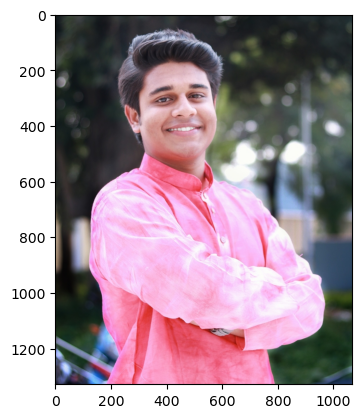

In [9]:
#show image 
img = image.load_img("C:\\Users\\USER\\Desktop\\Skills\\Deep Learning\\Mood check by image\\Dataset\\training\\happy_image\\h_img (3).jpg")
plt.imshow(img)

In [12]:
#read this image
cv2.imread("C:\\Users\\USER\\Desktop\\Skills\\Deep Learning\\Mood check by image\\Dataset\\training\\happy_image\\h_img (3).jpg").shape

(1329, 1066, 3)

In [14]:
# Creating an ImageDataGenerator instance for the training data.
# 'rescale' is used to normalize the image pixel values to a range between 0 and 1.
# This is done by dividing the pixel values by 255 (since pixel values in an image range from 0 to 255).
train = ImageDataGenerator(rescale = 1/255)

# Creating another ImageDataGenerator instance for the validation data.
# Similarly, rescaling the pixel values of the validation images to range between 0 and 1.
validation = ImageDataGenerator(rescale = 1/255)

In [18]:

train_dataset = train.flow_from_directory(
    r'C:\Users\USER\Desktop\Skills\Deep Learning\Mood check by image\Dataset\training', 
    target_size=(200, 200),
    batch_size=3,
    class_mode='binary'  # Binary classification (e.g., two classes: 0 or 1)
)

validation_dataset = validation.flow_from_directory(
    r'C:\Users\USER\Desktop\Skills\Deep Learning\Mood check by image\Dataset\validation',  
    target_size=(200, 200), 
    batch_size=3,
    class_mode='binary'  
)


Found 29 images belonging to 2 classes.
Found 29 images belonging to 2 classes.




### Explanation:

1. **`train.flow_from_directory()` and `validation.flow_from_directory()`**:
   - These functions are part of the `ImageDataGenerator` class from Keras, used for loading images directly from a directory.
   - The `flow_from_directory` method will read the images from the specified directory and apply any preprocessing specified (like rescaling, augmentation, etc.).
   - **`train` and `validation`** are instances of `ImageDataGenerator` that you created earlier, with rescaling applied. These instances will handle preprocessing for the respective datasets.

2. **`r'C:\Users\USER\Desktop\Skills\Deep Learning\Mood check by image\Dataset\training'`** and **`r'C:\Users\USER\Desktop\Skills\Deep Learning\Mood check by image\Dataset\validation'`**:
   - These are the file paths pointing to your training and validation dataset folders.
   - The `r` before the string makes it a raw string, which is necessary because backslashes (`\`) in file paths are interpreted as escape characters in Python. Using `r` avoids this issue.
   - The images should be organized in subdirectories within these folders, with each subdirectory representing a different class. For example, `training` folder might have subfolders like `happy`, `sad`, etc., each containing images of the respective mood.

3. **`target_size=(200, 200)`**:
   - This resizes all images to 200x200 pixels before feeding them into the neural network. This is important because neural networks require consistent input sizes.
   - You can adjust the size based on the type of network and the complexity of your images.

4. **`batch_size=3`**:
   - This defines how many images will be passed through the model in one iteration (or "batch"). 
   - A batch size of 3 means that the model will process 3 images at a time during training or validation.
   - You can adjust this number depending on the available memory and the nature of your problem.

5. **`class_mode='binary'`**:
   - Since you're doing **binary classification** (e.g., classifying images into two categories like "happy" or "sad"), this argument specifies that there are only two classes in your dataset.
   - For binary classification, the labels will be encoded as 0 or 1, where `0` could represent one class and `1` represents the other.
   - If you were doing multi-class classification (more than two classes), you would use `class_mode='categorical'`.

- **Training Data (`train_dataset`)**: The images in the training dataset will be read from the `training` folder, resized to 200x200 pixels, processed in batches of 3, and treated as binary classification (two classes).
- **Validation Data (`validation_dataset`)**: The images in the validation dataset will be read from the `validation` folder with similar settings, and will also be treated as binary classification.


In [20]:
train_dataset.class_indices

{'happy_image': 0, 'unhappy_image': 1}

In [22]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1])

In [23]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(200, 200, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    
    tf.keras.layers.Flatten(),
    
    tf.keras.layers.Dense(512, activation='relu'),
    
    tf.keras.layers.Dense(1, activation='sigmoid')
])

C:\Users\USER\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Here's an explanation of each layer in your **Convolutional Neural Network (CNN)** model:
### Explanation:

1. **Input Layer**:
   - `input_shape=(200, 200, 3)`: The input to the network is an image of size 200x200 pixels with 3 color channels (RGB). This shape is provided to the first convolutional layer to let the model know the input dimensions.

2. **First Convolutional Layer (Conv2D)**:
   - `tf.keras.layers.Conv2D(16, (3, 3), activation='relu')`:
     - **16**: The number of filters (kernels) used to perform the convolution. Each filter will learn a different feature in the image.
     - **(3, 3)**: The size of the filters. A 3x3 filter is commonly used as it captures small features like edges.
     - **activation='relu'**: The ReLU activation function is applied to introduce non-linearity, which helps the model learn complex patterns. ReLU replaces negative values with 0, keeping positive values unchanged.
     - This layer scans the input image and creates feature maps that capture spatial patterns in the image (like edges or textures).

3. **First Max Pooling Layer (MaxPooling2D)**:
   - `tf.keras.layers.MaxPooling2D(2, 2)`:
     - **(2, 2)**: The size of the pooling window. It reduces the spatial dimensions of the feature maps by taking the maximum value within a 2x2 window, helping to reduce computation and avoid overfitting.
     - Pooling helps the model become invariant to small translations and distortions in the input image.

4. **Second Convolutional Layer (Conv2D)**:
   - `tf.keras.layers.Conv2D(32, (3, 3), activation='relu')`:
     - This is another convolutional layer, but with 32 filters instead of 16, allowing the model to learn more complex features as the network deepens.
     - It still uses a 3x3 filter and ReLU activation to capture more abstract features from the input.

5. **Second Max Pooling Layer (MaxPooling2D)**:
   - Again, this layer downsamples the feature maps by using the same 2x2 window.

6. **Third Convolutional Layer (Conv2D)**:
   - `tf.keras.layers.Conv2D(64, (3, 3), activation='relu')`:
     - This layer has 64 filters, making it capable of capturing even more complex features from the image. As the network deepens, the number of filters typically increases to capture more high-level patterns.
   
7. **Third Max Pooling Layer (MaxPooling2D)**:
   - This layer continues the downsampling process, reducing the spatial dimensions of the feature maps.

8. **Flatten Layer**:
   - `tf.keras.layers.Flatten()`:
     - After the convolutional and pooling layers, the output is a 3D tensor. The **Flatten** layer converts this 3D output into a 1D array (vector) so it can be fed into fully connected (dense) layers for classification.

9. **Fully Connected Layer (Dense)**:
   - `tf.keras.layers.Dense(512, activation='relu')`:
     - This layer is a fully connected layer with 512 neurons. It receives the flattened vector and uses ReLU activation to learn complex non-linear relationships between features.
     - The size of this layer (512 units) can be adjusted depending on the complexity of the problem and the amount of data.

10. **Output Layer (Dense)**:
   - `tf.keras.layers.Dense(1, activation='sigmoid')`:
     - The final layer is also a fully connected layer with a single neuron (because it's a binary classification task). The output is passed through a **sigmoid activation function**, which outputs a value between 0 and 1. This is ideal for binary classification (e.g., "happy" or "sad" in mood detection).
     - If the output is close to 1, it represents one class (e.g., "happy"), and if it's close to 0, it represents the other class (e.g., "sad").

### Summary of Model Architecture:
- The model consists of **three convolutional layers** and **three pooling layers** to extract features from the input image.
- It then **flattens** the output of the last convolutional layer into a 1D vector and passes it through **fully connected layers** to make the final decision.
- The **output layer** has a **sigmoid activation** to produce a probability for the binary classification task.

This architecture is commonly used for tasks like **binary image classification**, where the goal is to classify images into two categories (e.g., recognizing whether an image shows a "happy" or "sad" face). 


In [26]:
model.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(learning_rate=0.001),
    metrics=['accuracy']
)

This code is used to **compile** the Keras model, which is an essential step before training a neural network in TensorFlow/Keras. The `compile` method specifies the **loss function**, the **optimizer**, and the **metrics** the model should use during training. Let’s break down the components:

### 1. **loss='binary_crossentropy'**:
   - The **loss function** defines how the model's performance is evaluated and how the model’s weights are updated during training.
   - **Binary Cross-Entropy** (`binary_crossentropy`) is the appropriate loss function for **binary classification** tasks, where the goal is to classify input into one of two classes (e.g., "yes" or "no", "positive" or "negative").
   - The formula for binary cross-entropy is:
     
     L = -y log(p) + (1 - y) log(1 - p)
     
     Where:
     -  y is the true label (0 or 1),
     -  p  is the predicted probability that the input belongs to class 1.
   - The goal of training is to minimize this loss, which means improving the accuracy of the model’s predictions.

### 2. **optimizer=RMSprop(learning_rate=0.001)**:
   - The **optimizer** is responsible for updating the model’s weights based on the gradients computed during training. The optimizer adjusts the learning rate to minimize the loss function.
   - **RMSprop (Root Mean Square Propagation)** is an adaptive optimizer commonly used in deep learning, especially for tasks like image classification.
     - It divides the learning rate by a moving average of the squared gradients to help smooth out large gradient fluctuations and to converge faster.
   - **learning_rate=0.001**: This is the initial learning rate for RMSprop. It determines the size of the steps taken to minimize the loss function. A smaller learning rate (like 0.001) helps prevent overshooting during training.

### 3. **metrics=['accuracy']**:
   - **metrics** specifies the metrics to monitor during training and evaluation. It tells Keras which metrics you want to track and use for model evaluation.
   - **accuracy**: This is the most common metric for classification tasks. It measures the proportion of correct predictions. For binary classification, it’s calculated as:

     accuracy = correct predictions/total predictions
     
   - By using `metrics=['accuracy']`, you are instructing Keras to track and report the accuracy during the training process and on validation data after each epoch.

### Recap:
- **Loss Function**: `binary_crossentropy` for binary classification.
- **Optimizer**: `RMSprop` with a learning rate of 0.001 to adaptively adjust learning during training.
- **Metric**: `accuracy` to measure how well the model is classifying the data correctly.

This setup prepares the model to train efficiently by specifying how to measure error (`binary_crossentropy`), how to adjust the weights during training (`RMSprop`), and how to monitor the model’s success (`accuracy`).

In [30]:
model_fit = model.fit(train_dataset,
                      steps_per_epoch = 3,
                      epochs = 50,
                      validation_data = validation_dataset)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 444ms/step - accuracy: 0.3889 - loss: 0.6936 - val_accuracy: 0.7241 - val_loss: 0.5323
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step - accuracy: 0.7917 - loss: 0.5147 - val_accuracy: 0.9655 - val_loss: 0.4002
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 354ms/step - accuracy: 1.0000 - loss: 0.2785 - val_accuracy: 0.7931 - val_loss: 0.3536
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step - accuracy: 0.6667 - loss: 0.6467 - val_accuracy: 0.6207 - val_loss: 0.5925
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 378ms/step - accuracy: 0.6111 - loss: 0.6720 - val_accuracy: 0.9310 - val_loss: 0.3852
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - accuracy: 1.0000 - loss: 0.3639 - val_accuracy: 0.9655 - val_loss: 0.2515
Epoch 7/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 333ms/step - accuracy: 0.7708 - loss: 0.4695 - val_accuracy: 0.9310 - val_loss: 0.4559
Epoch 8/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - accuracy: 1.0000 - loss: 0.3905 - val_accuracy: 1.0000 - val_loss:

The code you've provided uses the `model.fit` method in TensorFlow to train a deep learning model. Let’s break it down and explain what each part does:

### Explanation of Each Component:

1. **`train_dataset`**:
   - This is the data used for **training** the model.
   - It is typically an instance of `ImageDataGenerator` or any other data generator that yields batches of images and labels. 
   - The `train_dataset` will provide data in batches for the model to learn from. 

2. **`steps_per_epoch=3`**:
   - This argument specifies how many steps (or batches) the model should process per epoch.
   - **Steps** represent how many batches of data the model should process before completing an epoch.
   - If you have a dataset with 1000 images and a batch size of 3, you would have roughly 333 steps per epoch (1000/3). By setting `steps_per_epoch=3`, you are telling the model to process only 3 batches per epoch. 
   - **Why use this?**: Typically, you don't need to specify `steps_per_epoch` unless you're working with very large datasets, or when the dataset is not the entire training data (like when data generators are used). It’s important to balance it with your batch size and dataset size for proper training.

3. **`epochs=10`**:
   - **Epochs** refer to the number of complete passes the model makes over the entire dataset during training.
   - With `epochs=10`, the model will go through the entire training dataset 10 times.
   - Each time the model sees the dataset, it will learn and adjust its weights. After 10 epochs, the model will have seen the data 10 times.
   - **Why use this?**: Multiple epochs help the model learn from the data progressively and improve its performance. More epochs can lead to better training, but you also need to be careful of overfitting (where the model memorizes the training data too well and performs poorly on new data).

4. **`validation_data=validation_dataset`**:
   - This is the dataset used to **evaluate the model** after each epoch. 
   - **Validation data** helps track the model’s performance on unseen data. It’s important because it tells you how well the model generalizes to data it hasn't seen before.
   - **Why use this?**: By providing validation data, the model's performance can be evaluated after each epoch. This helps to monitor overfitting (if the model performs well on the training data but poorly on the validation data).

### Recap:
- **`train_dataset`**: Provides the training data.
- **`steps_per_epoch=3`**: Tells the model how many steps (batches) to process before completing an epoch.
- **`epochs=10`**: Defines how many times the model will process the entire training dataset.
- **`validation_data=validation_dataset`**: Evaluates the model on a separate validation set after each epoch to track its performance.

In summary, this code trains the model for 10 epochs, processes 3 batches per epoch, and evaluates the model on a validation dataset after each epoch to monitor progress.

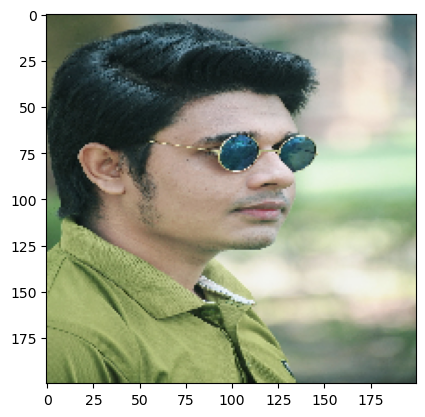

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


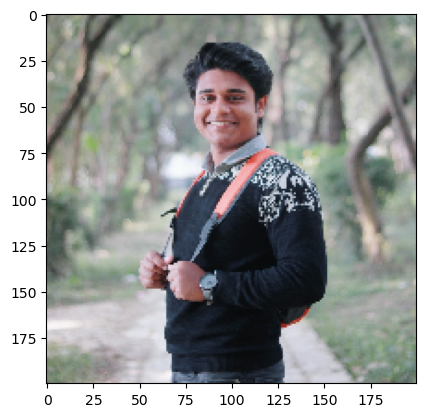

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


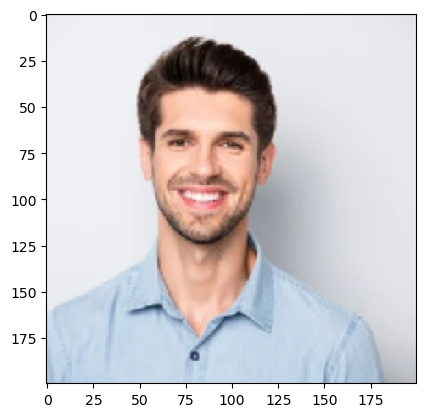

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


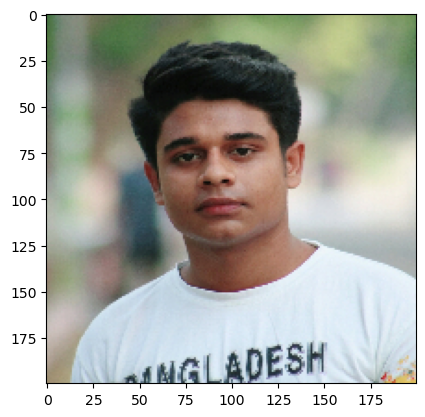

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


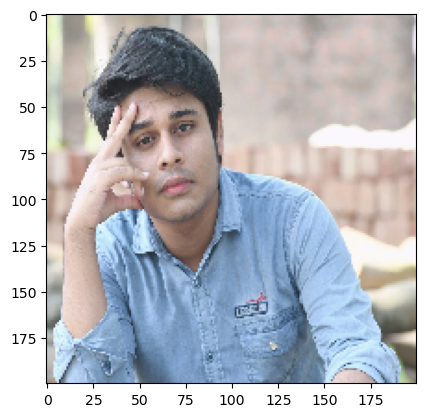

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


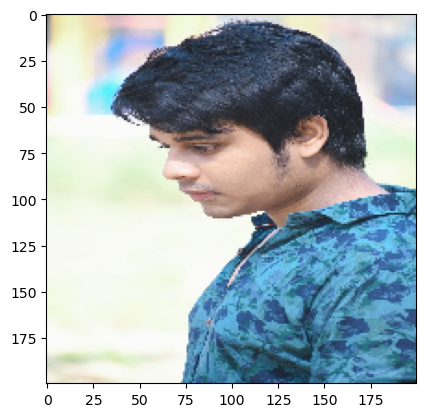

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


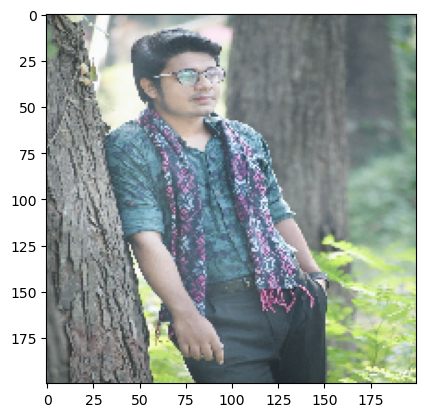

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


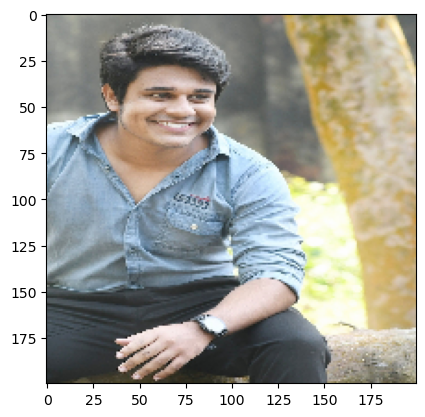

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
You are happy


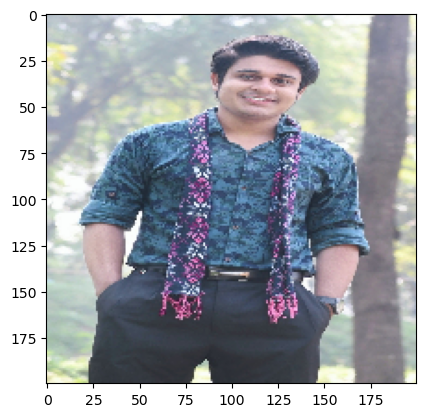

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


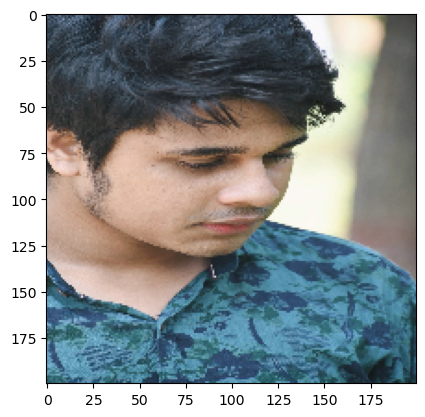

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
You are not happy


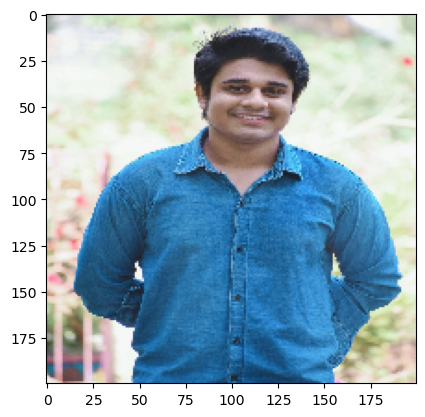

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


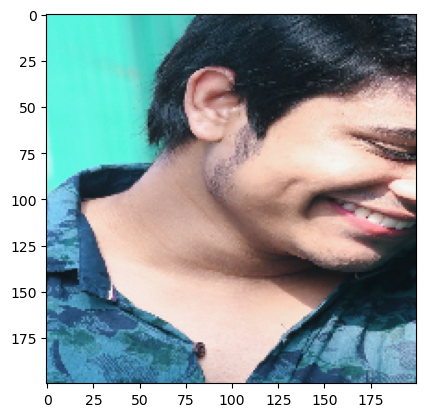

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


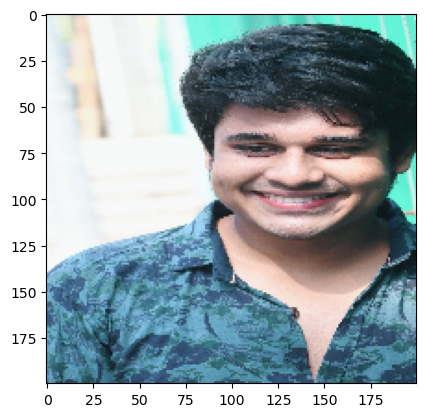

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


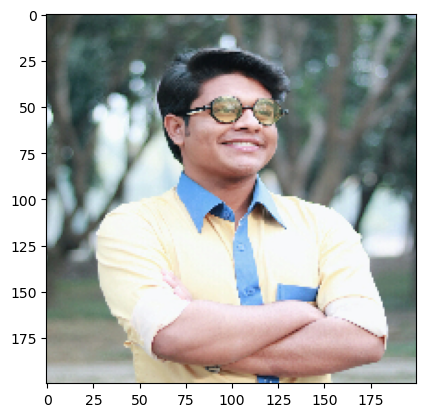

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


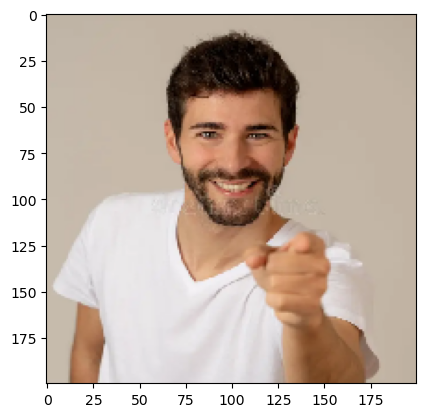

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


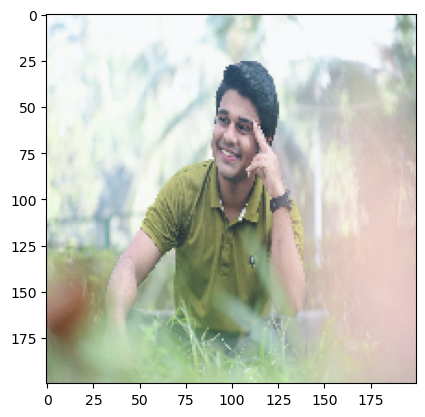

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


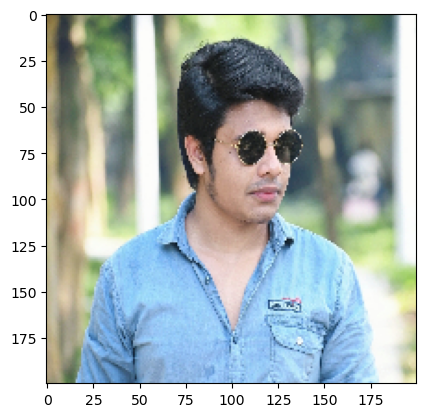

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are not happy


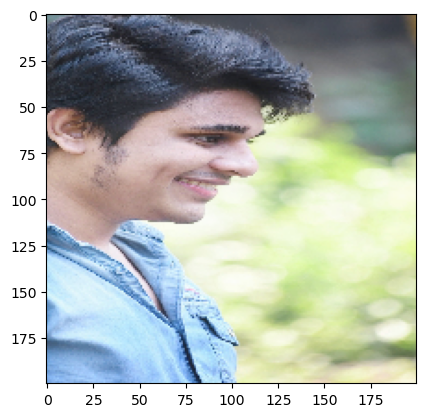

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
You are happy


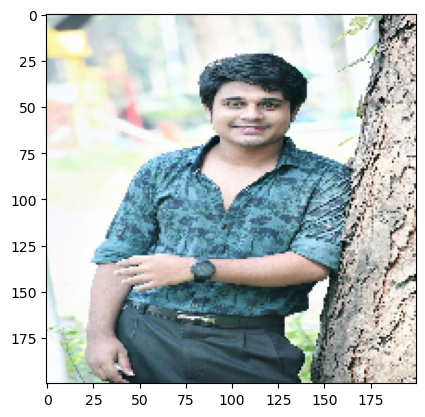

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


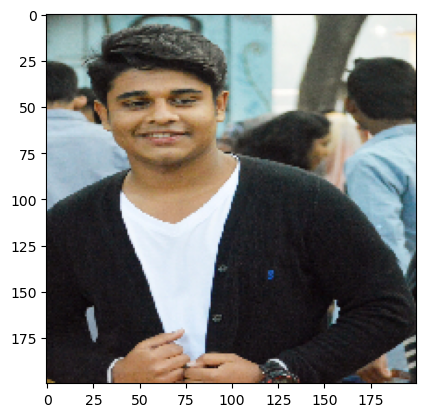

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


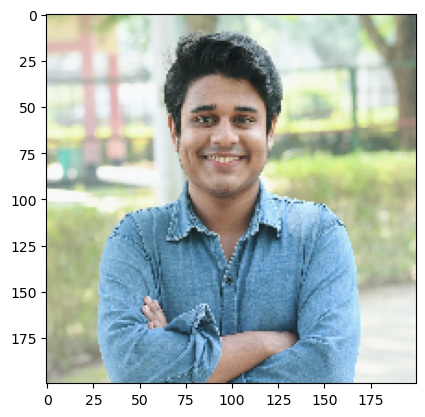

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


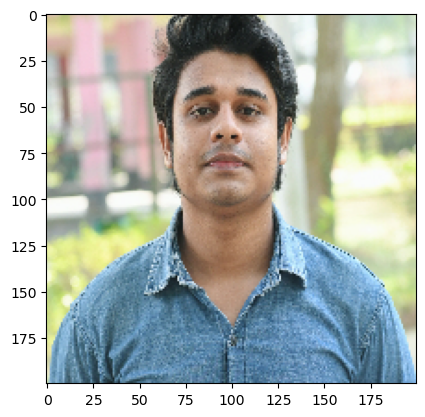

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


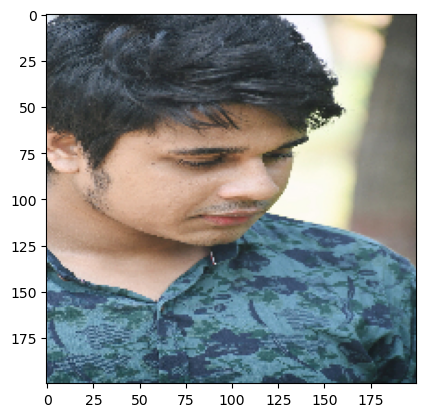

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are not happy


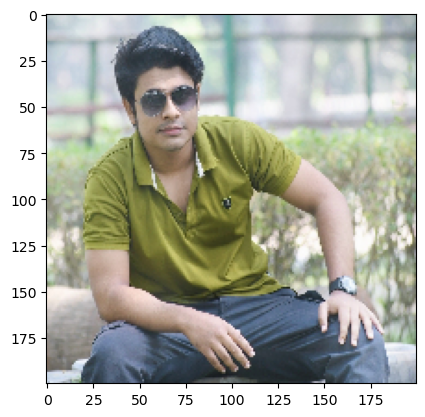

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


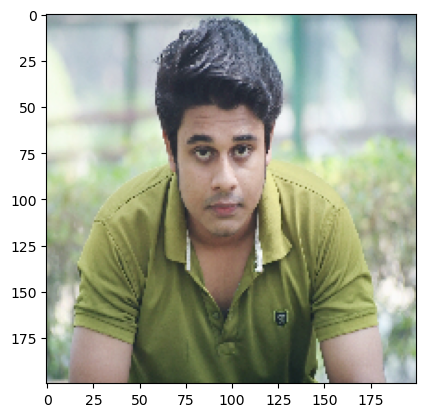

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
You are not happy


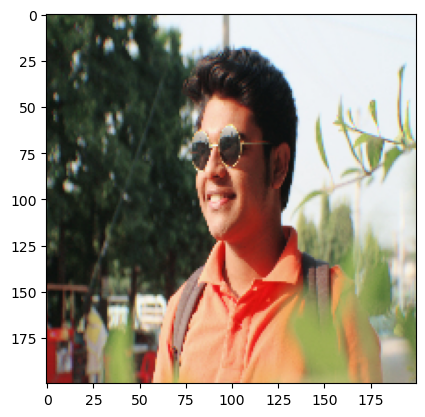

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are happy


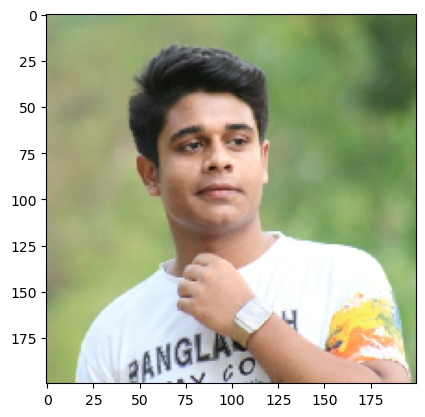

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
You are not happy


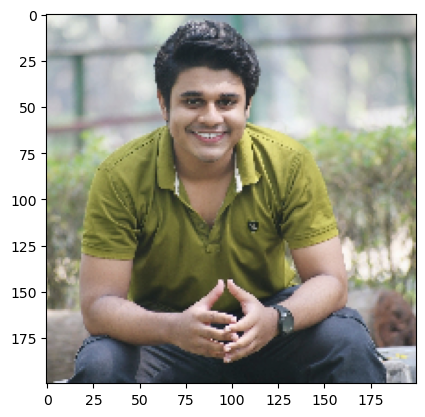

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


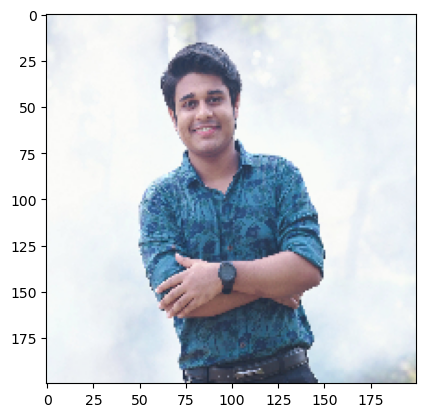

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


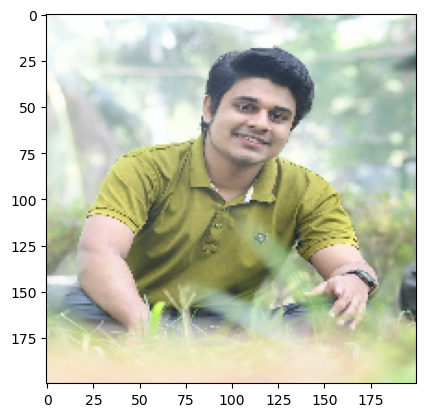

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


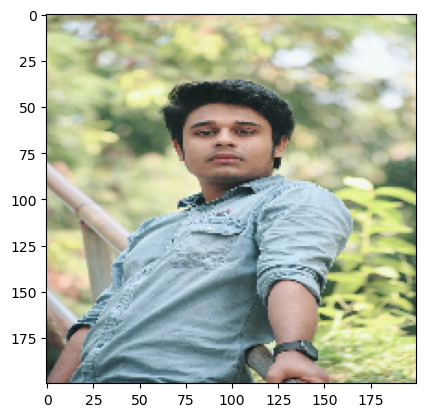

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


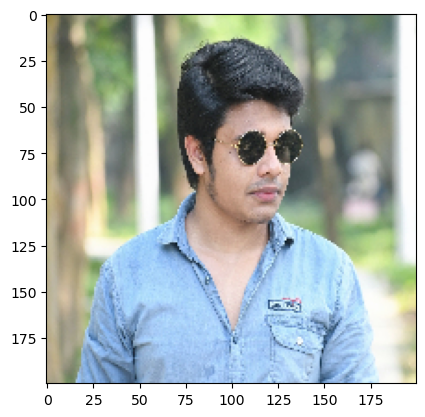

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
You are not happy


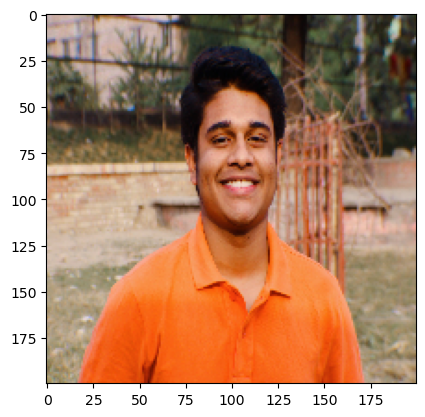

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


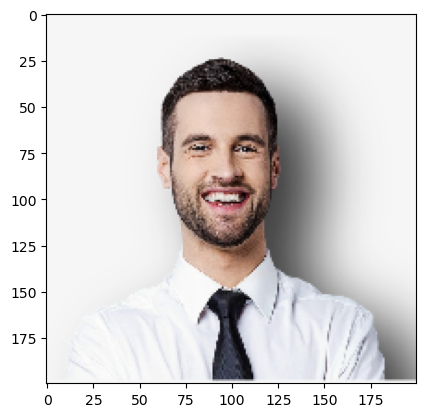

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


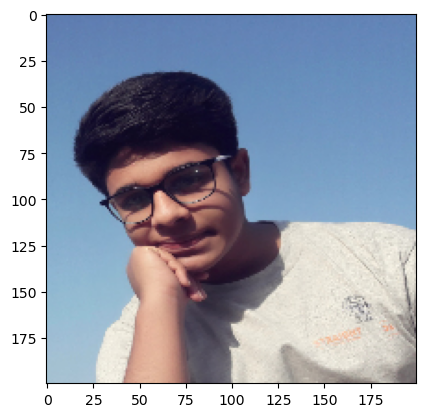

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


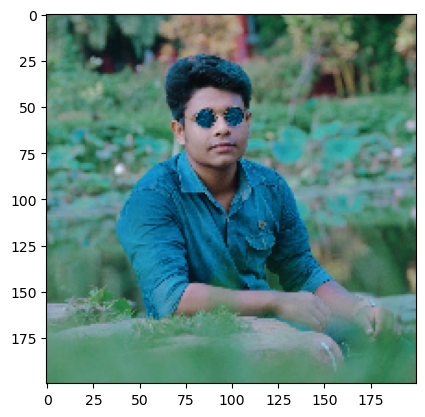

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


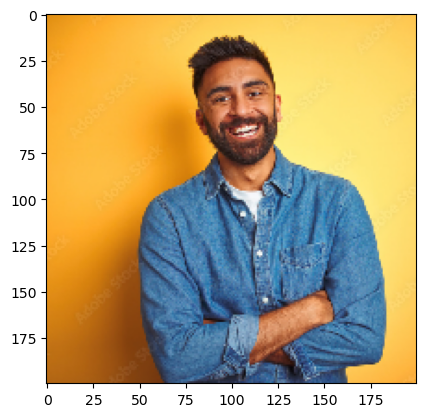

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


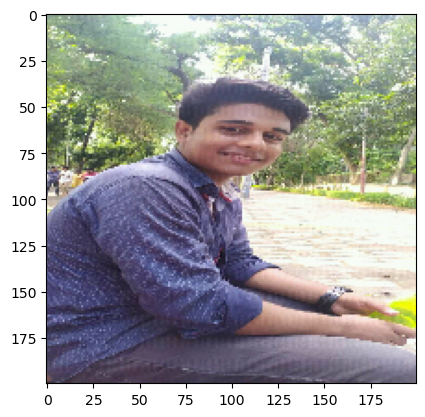

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


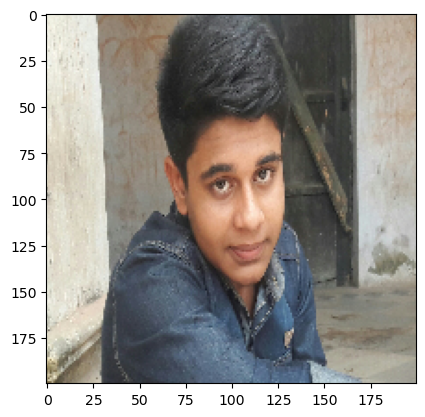

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are not happy


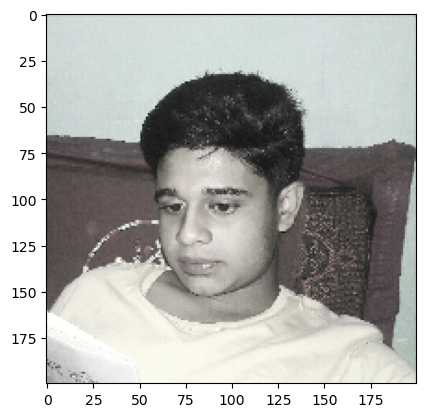

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
You are happy


In [58]:
import os
test_dataset = r'C:\Users\USER\Desktop\Skills\Deep Learning\Mood check by image\Dataset\testing'

for i in os.listdir(test_dataset):
    img = image.load_img(os.path.join(test_dataset, i), target_size=(200, 200))  
    plt.imshow(img)
    plt.show()

   
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis=0)  
    
    images = np.vstack([X]) 
    
   
    val = model.predict(images)

    
    if val[0] == 0: 
        print("You are happy")
    else:
        print("You are not happy")
